In [28]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno

import category_encoders as ce
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import roc_auc_score

from pandas.testing import assert_series_equal

%matplotlib inline
pd.set_option('display.max_columns', None)


# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/santander-customer-satisfaction/sample_submission.csv
/kaggle/input/santander-customer-satisfaction/train.csv
/kaggle/input/santander-customer-satisfaction/test.csv


# Abordagens para Diagnóstico de modelos

- #### Diagnóstico de viés e variância

- #### Influencia das instancias de treino

- #### Diagnóstico sobre comportamento das features

- #### Diagnóstico sobre comportamento das previsões

# Analise de residuos - Modelos não paramétricos

### Diversas caracteristicas clássicas de analise de resíduos não são validas:

- Não se assume mais uma distribuição especifica no erro.
- O resíduo não precisa estar necessariamente estar centrado no 0.
- Não se assume assumido variância constante nos valores dos residuos.
- É comum que as estimativas não sejam calibradas (por exemplo, em problemas de classificação), portanto a probabilidade/valor estimado não corresponde ao probabilidade/valor real da observação. 

### Mesmo assim, diversas outras caracteristicas se mantem como ponto de interesse, ao mantermos uma perspectiva flexível:

- É esperado que a probabilidade/valor estimado tenha comportamento monotinicamente crescente conforme cresce a probabilidade/valor observado.
- Residuos com curvas deterministicas ainda podem guardar boas informações para melhoria dos modelos.
- Intervalos com resíduos excessivamente grandes em comparação as vizinhanças e restante dos valores podem ser utéis ao serem melhor analisados.
- Intervalos com grandes alterações na variância dos residuos podem apresentar pontos importantes de atenção.


### Algumas motivações gerais para comportamentos "interessantes" nos residuos:

- A relação da variavel com target não conseguiu ser capturada pelo modelo
- Interações entre variaveis utilizadas não conseguiu ser bem capturada pelo modelo.
- Subpopulações com caracteristicas consideravelmente diferentes entre Variaveis Independentes X Target.
- Mudança na distribuição das variaveis independentes entre treino/teste (Concept Drift).
- A existência de variaveis externas não includas no modelo que poderiam explicar a alta variância ou crescimento dos residuos. 
- Erros cometidos pela não capacidade de extrapolações de modelos não paramétricos

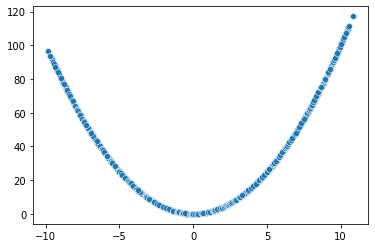

In [29]:
x = np.linspace(-10, 10, 1000) + np.random.rand(1000)

y = x ** 2

sns.scatterplot(x=x, y=y);

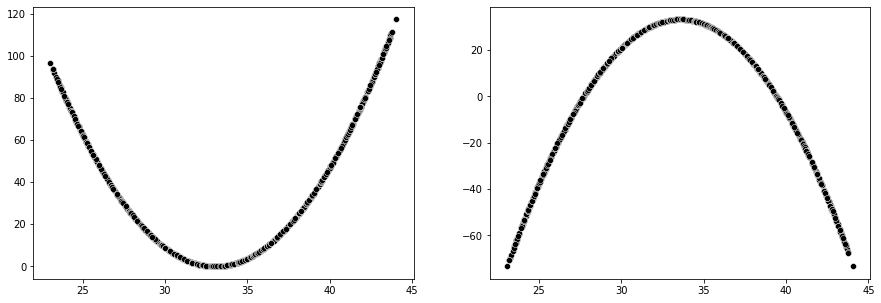

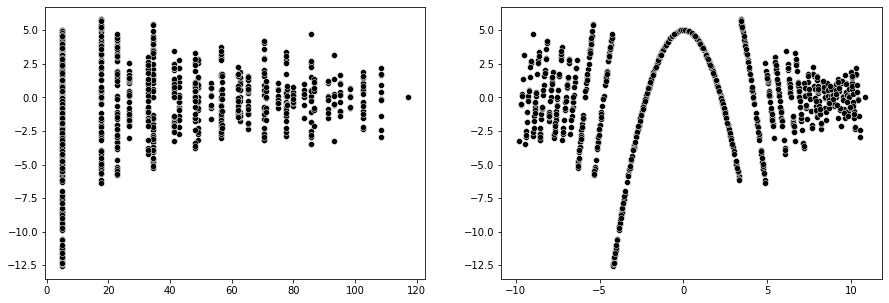

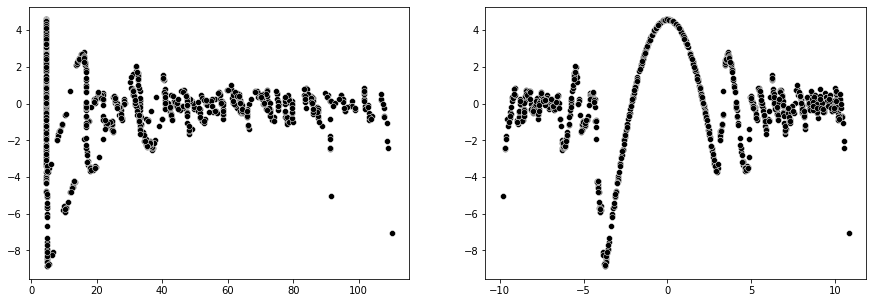

In [30]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor




lr = LinearRegression()

lr.fit(x.reshape(-1,1), y)
y_predicted = lr.predict(x.reshape(-1,1))

residuals = y_predicted - y

#sns.scatterplot(x = y_predicted, y = residuals);
f, axes = plt.subplots(1, 2, figsize = (15,5))

sns.scatterplot(x = y_predicted,
                y = y,
                ax = axes[0],
                color = 'black',
                palette = 'tab10');

sns.scatterplot(x = y_predicted,
                y = residuals,
                ax = axes[1],
                color = 'black',
                palette = 'tab10');

###################################################


tr = DecisionTreeRegressor(max_depth = 5)


tr.fit(x.reshape(-1,1), y)
y_predicted = tr.predict(x.reshape(-1,1))

residuals = y_predicted - y


#sns.scatterplot(x = y_predicted, y = residuals);
f, axes = plt.subplots(1, 2, figsize = (15,5))

sns.scatterplot(x = y_predicted,
                y = residuals,
                ax = axes[0],
                color = 'black',
                palette = 'tab10');

sns.scatterplot(x = x,
                y = residuals,
                ax = axes[1],
                color = 'black',
                palette = 'tab10');

###################################################

rfr = RandomForestRegressor(max_depth = 5, max_samples = 0.3, random_state = 42)

rfr.fit(x.reshape(-1,1), y)
y_predicted = rfr.predict(x.reshape(-1,1))

residuals = y_predicted - y


#sns.scatterplot(x = y_predicted, y = residuals);
f, axes = plt.subplots(1, 2, figsize = (15,5))

sns.scatterplot(x = y_predicted,
                y = residuals,
                ax = axes[0],
                color = 'black',
                palette = 'tab10');

sns.scatterplot(x = x,
                y = residuals,
                ax = axes[1],
                color = 'black',
                palette = 'tab10');


In [31]:
pandas_df = pd.read_csv('../input/santander-customer-satisfaction/train.csv')
pandas_df.set_index('ID', inplace = True)
pandas_df = pandas_df.drop_duplicates()



X_train, X_test, y_train, y_test = train_test_split(pandas_df.drop(['TARGET'], axis = 1), pandas_df['TARGET'], test_size = 0.20, random_state = 42)

In [32]:
colunas_selecionadas = ['var15', 'imp_op_var41_efect_ult1', 'imp_op_var41_efect_ult3',
       'imp_op_var39_ult1', 'num_var4', 'num_var5', 'num_var30_0', 'num_var30',
       'saldo_var30', 'var36', 'num_var22_ult1', 'num_var22_ult3',
       'num_med_var22_ult3', 'num_meses_var5_ult3', 'num_var45_hace3',
       'num_var45_ult1', 'num_var45_ult3', 'saldo_medio_var5_hace2',
       'saldo_medio_var5_hace3', 'saldo_medio_var5_ult3', 'var38']

X_train_clean = X_train[colunas_selecionadas]
X_test_clean = X_test[colunas_selecionadas]

In [33]:
rf = RandomForestClassifier(max_depth = 8)

rf.fit(X_train, y_train)

y_predicted_train = rf.predict_proba(X_train)
y_predicted_train = pd.DataFrame(y_predicted_train, index = X_train.index)[1]


y_predicted_test = rf.predict_proba(X_test)
y_predicted_test = pd.DataFrame(y_predicted_test, index = X_test.index)[1]

print(roc_auc_score(y_train, y_predicted_train))
print(roc_auc_score(y_test, y_predicted_test))

from sklearn.metrics import log_loss

prediction_logloss = list(map(lambda a, b : log_loss([a], [b], labels = [0,1]), y_train, y_predicted_train))
prediction_logloss_train = pd.Series(prediction_logloss, index = X_train.index)

resultados_estimacao_train = pd.concat([y_train, y_predicted_train, (y_predicted_train - y_train), prediction_logloss_train], axis = 1)
resultados_estimacao_train.columns = ['target', 'predicted', 'residuals', 'logloss']

feature_e_resultados_train = X_train.join(resultados_estimacao_train)

prediction_logloss = list(map(lambda a, b : log_loss([a], [b], labels = [0,1]), y_test, y_predicted_test))
prediction_logloss_test = pd.Series(prediction_logloss, index = X_test.index)

resultados_estimacao_test = pd.concat([y_test, y_predicted_test, (y_predicted_test - y_test), prediction_logloss_test], axis = 1)
resultados_estimacao_test.columns = ['target', 'predicted', 'residuals', 'logloss']

feature_e_resultados_test = X_test.join(resultados_estimacao_test)

0.8433716185199204
0.8180110000656361


In [34]:
rf.fit(X_train_clean, y_train)

y_predicted_train_clean = rf.predict_proba(X_train_clean)
y_predicted_train_clean = pd.DataFrame(y_predicted_train_clean, index = X_train.index)[1]


y_predicted_test_clean = rf.predict_proba(X_test_clean)
y_predicted_test_clean = pd.DataFrame(y_predicted_test_clean, index = X_test.index)[1]

print(roc_auc_score(y_train, y_predicted_train_clean))
print(roc_auc_score(y_test, y_predicted_test_clean))



######################################################

prediction_logloss = list(map(lambda a, b : log_loss([a], [b], labels = [0,1]), y_train, y_predicted_train))
prediction_logloss_train_clean = pd.Series(prediction_logloss, index = X_train.index)

resultados_estimacao_train_clean = pd.concat([y_train, y_predicted_train_clean, (y_predicted_train_clean - y_train), prediction_logloss_train_clean], axis = 1)
resultados_estimacao_train_clean.columns = ['target', 'predicted', 'residuals', 'logloss']

feature_e_resultados_train_clean = X_train.join(resultados_estimacao_train_clean)

prediction_logloss = list(map(lambda a, b : log_loss([a], [b], labels = [0,1]), y_test, y_predicted_test_clean))
prediction_logloss_test_clean = pd.Series(prediction_logloss, index = X_test.index)

resultados_estimacao_test_clean = pd.concat([y_test, y_predicted_test_clean, (y_predicted_test_clean - y_test), prediction_logloss_test_clean], axis = 1)
resultados_estimacao_test_clean.columns = ['target', 'predicted', 'residuals', 'logloss']

feature_e_resultados_test_clean = X_test.join(resultados_estimacao_test_clean)


0.8723254435487118
0.8428629505948098


# Ultimas considerações importantes antes de seguir nas analises:

- Residuos em problemas de classificação necessitam de algum tratamento para serem analisados
- Caso fosse utilizados de maneira direta, assim como é feito nos residuos de regressão, teriamos pouquissima informação na analise de residuos em relação a target, dado que apenas temos o valor observado contem apenas 2 valores em uma problema binário e não é uma variavel continua.

Segue exemplo abaixo:

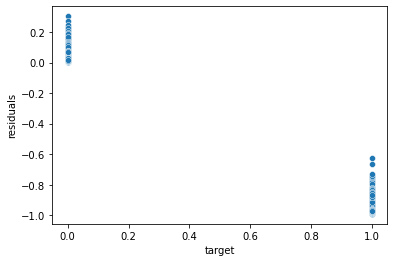

In [19]:
sns.scatterplot(x = feature_e_resultados_test['target'], y = feature_e_resultados_test['residuals']);

- #### Uma forma de lidar com esse problema é a partir da construção de bins para valores estimados/valores realizados, de maneira a substituior o uso dos residuos brutos e target bruta por residuo médio e target médio de cada bin.
- #### Uma referencia na literatura para quantidade de bins, que contem o mesmo numero de observações, é de n**(1/2).

In [35]:
def analise_residuos_predicted(df_resultados,
                               segmentation_var = None, 
                               numero_de_bins = None,
                               quantil = True, 
                               figsize = (30, 9)):
       
    numero_de_bins = int(df_resultados.shape[0] ** (1/2)) if numero_de_bins == None else numero_de_bins
    porcentagem_limite_cada_bin = np.linspace(0, 1, numero_de_bins)
    label_cada_bin = df_resultados['predicted'].quantile(porcentagem_limite_cada_bin)    
    label_cada_bin_sem_duplicatas = label_cada_bin.drop_duplicates().to_list()

    df_resultados['quantis_predicted'] = pd.qcut(df_resultados['predicted'],
                                                 q = porcentagem_limite_cada_bin,
                                                 duplicates = 'drop',
                                                 labels = [i for i in range(0, len(label_cada_bin_sem_duplicatas))][1:])
    df_resultados['quantis_predicted'] = pd.to_numeric(df_resultados['quantis_predicted'])


    if segmentation_var != None:

        df_resultados_group = df_resultados.groupby(['quantis_predicted', segmentation_var]).agg({'target' : 'mean',
                                                                                                               'residuals' : 'mean',
                                                                                                               'predicted' : 'mean',
                                                                                                               segmentation_var : 'count'})
        df_resultados_group.columns = ['average target', 'average residual', 'average prediction', 'count']
        df_resultados_group = df_resultados_group.reset_index().set_index('quantis_predicted')

    else:

        df_resultados_group = df_resultados.groupby(['quantis_predicted']).agg({'target' : 'mean',
                                                                                'residuals' : 'mean',
                                                                                'predicted' : 'mean'})
        df_resultados_group.columns = ['average target', 'average residual', 'average prediction']




    predicted_bruto_ou_quantilizado = df_resultados_group.index if quantil == True else df_resultados_group['average prediction']
    size = None if segmentation_var == None else df_resultados_group['count']
    hue = None if segmentation_var == None else df_resultados_group[segmentation_var]



    # Plots - Average Target and Average Residual
    f, axes = plt.subplots(1, 2, figsize = figsize)

    sns.scatterplot(x = predicted_bruto_ou_quantilizado,
                    y = df_resultados_group['average target'],
                    ax = axes[0],
                    hue = hue,
                    size = size,
                    color = 'black',
                    palette = 'tab10');

    sns.scatterplot(x = predicted_bruto_ou_quantilizado,
                    y = df_resultados_group['average residual'],
                    ax = axes[1],
                    hue = hue,
                    size = size,
                    color = 'black',
                    palette = 'tab10');

In [48]:
#analise_residuos_predicted(df_resultados = feature_e_resultados_train)

#analise_residuos_predicted(df_resultados = feature_e_resultados_train_clean)

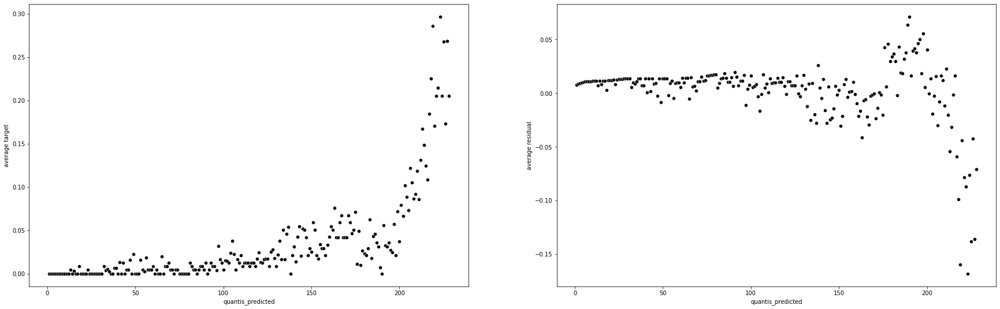

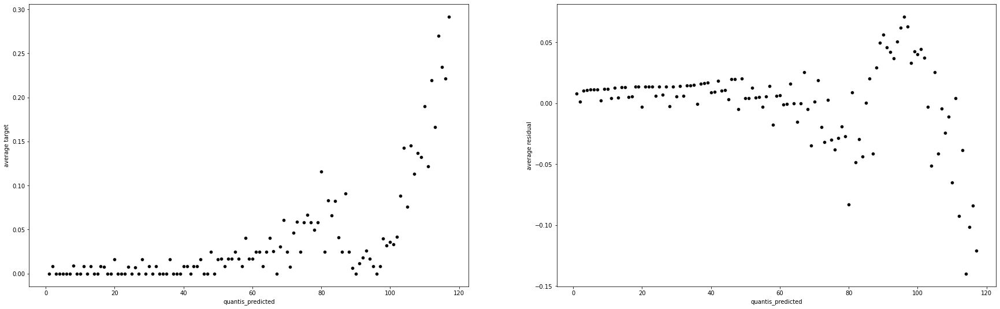

In [37]:
indices_outliers = feature_e_resultados_train.query('quantis_predicted > 226').index
analise_residuos_predicted(df_resultados = feature_e_resultados_train.drop(indices_outliers))
                          # segmentation_var = 'var36',
                          #numero_de_bins = 40)

analise_residuos_predicted(df_resultados = feature_e_resultados_test)
                         #  segmentation_var = 'var36',
                         #  numero_de_bins = 40)

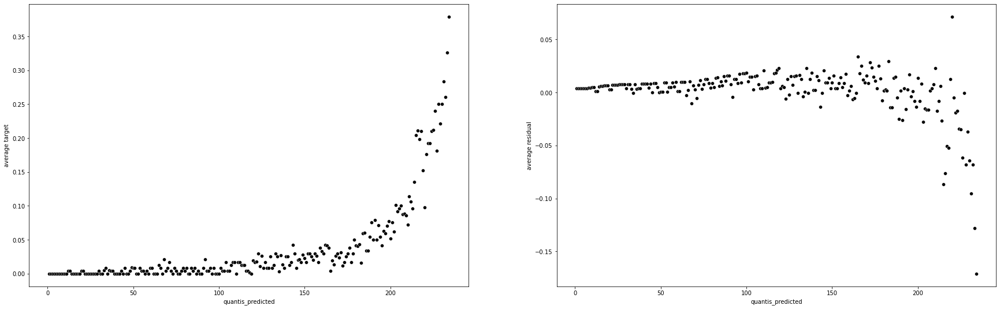

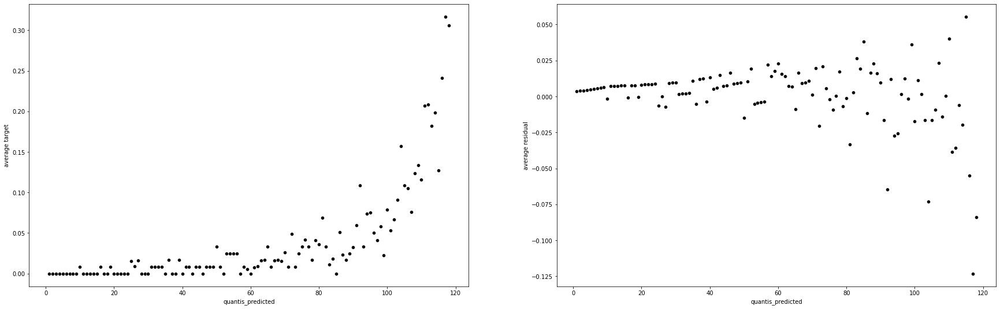

In [51]:
indices_outliers = feature_e_resultados_train_clean.query('quantis_predicted >= 235').index
analise_residuos_predicted(df_resultados = feature_e_resultados_train_clean.drop(indices_outliers))

analise_residuos_predicted(df_resultados = feature_e_resultados_test_clean)

In [39]:
def analise_residuos_feature(df_resultados, var_referencia, segmentation_var = None, numero_de_bins = None, quantil = True, figsize = (20,10)):
    
    if df_resultados[var_referencia].nunique() < 30:

        variaveis_agrupamento = var_referencia if segmentation_var == None else [var_referencia, segmentation_var]    
        df_resultados_group = df_resultados.groupby(variaveis_agrupamento).agg({var_referencia : 'count',
                                                                                'residuals' : 'mean'})
        df_resultados_group.columns = ['count', 'average residuals']
        df_resultados_group = df_resultados_group.reset_index().set_index(var_referencia)
        
        hue = None if segmentation_var == None else df_resultados_group[segmentation_var]
        size = df_resultados_group['count']

        plt.figure(figsize = figsize);
        sns.scatterplot(x = df_resultados_group.index, 
                        y = df_resultados_group['average residuals'],
                        hue = hue,
                        size = size,
                        color  = 'black',
                        palette = 'tab10');

    else:

        numero_de_bins = int(df_resultados.shape[0] ** (1/2)) if numero_de_bins == None else numero_de_bins
        porcentagem_limite_cada_bin = np.linspace(0, 1, numero_de_bins)
        label_cada_bin = df_resultados[var_referencia].quantile(porcentagem_limite_cada_bin)    
        label_cada_bin_sem_duplicatas = label_cada_bin.drop_duplicates().to_list()
        label_bruto_ou_quantilizado = [i for i in range(0, len(label_cada_bin_sem_duplicatas))] if quantil == True else label_cada_bin_sem_duplicatas

        df_resultados['binned_' + var_referencia] = pd.qcut(df_resultados[var_referencia],
                                                                    q = porcentagem_limite_cada_bin,
                                                                    duplicates = 'drop',
                                                                    labels = label_bruto_ou_quantilizado[1:])

        df_resultados['binned_' + var_referencia] = pd.to_numeric(df_resultados['binned_' + var_referencia])
        
        variaveis_agrupamento = 'binned_' + var_referencia if segmentation_var == None else ['binned_' + var_referencia, segmentation_var]    
        df_resultados_group = df_resultados.groupby(variaveis_agrupamento).agg({var_referencia : 'count',
                                                                                'residuals' : 'mean'})
        df_resultados_group.columns = ['count', 'average residuals']
        df_resultados_group = df_resultados_group.reset_index().set_index('binned_' + var_referencia)
        
        hue = None if segmentation_var == None else df_resultados_group[segmentation_var]
        size = df_resultados_group['count']
        
        plt.figure(figsize = figsize);
        sns.scatterplot(x = df_resultados_group.index, 
                        y = df_resultados_group['average residuals'],
                        size = size,
                        hue = hue,
                        color  = 'black',
                        palette = 'tab10');

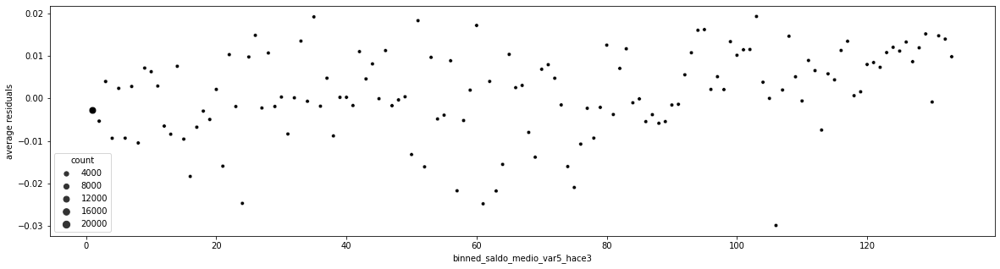

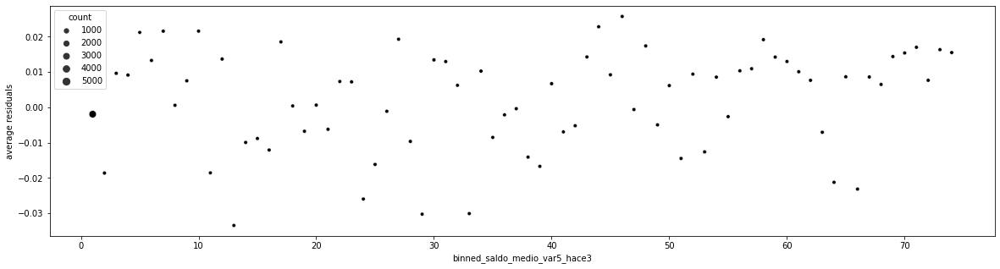

In [40]:
var_referencia = 'saldo_medio_var5_hace3'
var_segmentacao = None #'num_var4'
n_bins = None

analise_residuos_feature(df_resultados = feature_e_resultados_train, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 5))

analise_residuos_feature(df_resultados = feature_e_resultados_test, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 5))


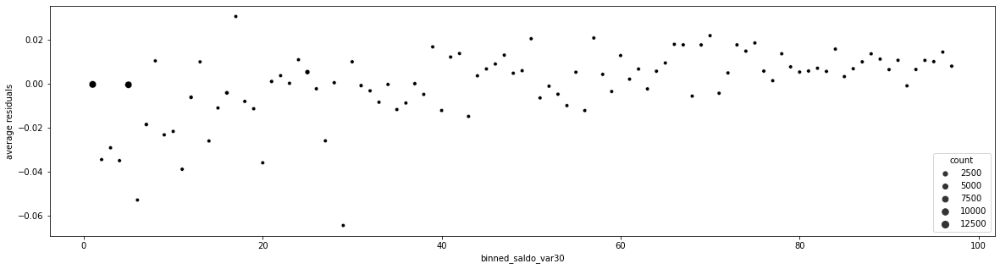

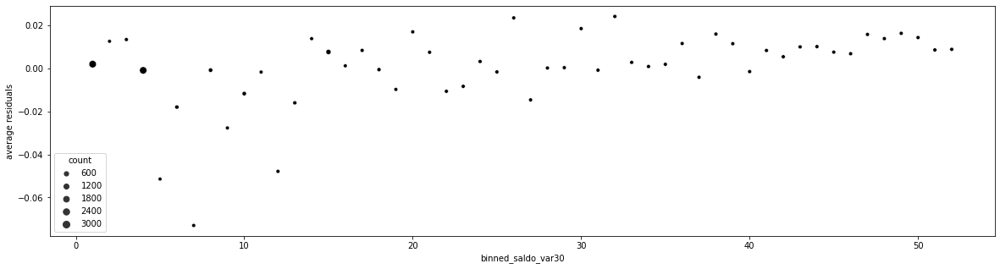

In [41]:
var_referencia = 'saldo_var30'
var_segmentacao = None #'num_var4'
n_bins = None

analise_residuos_feature(df_resultados = feature_e_resultados_train, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 5))

analise_residuos_feature(df_resultados = feature_e_resultados_test, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 5))


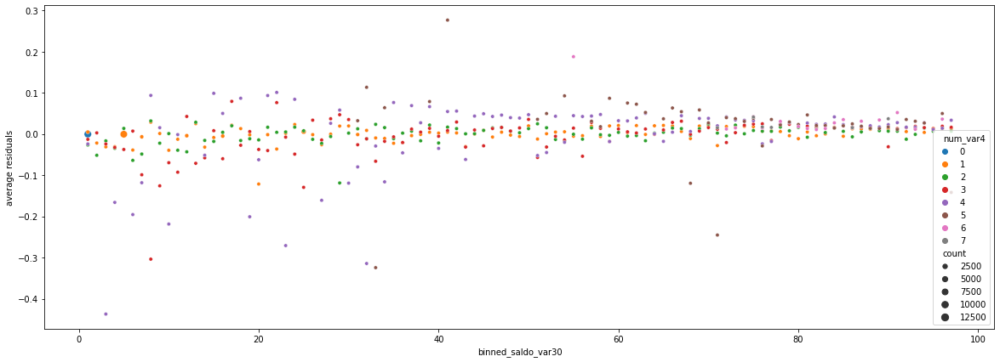

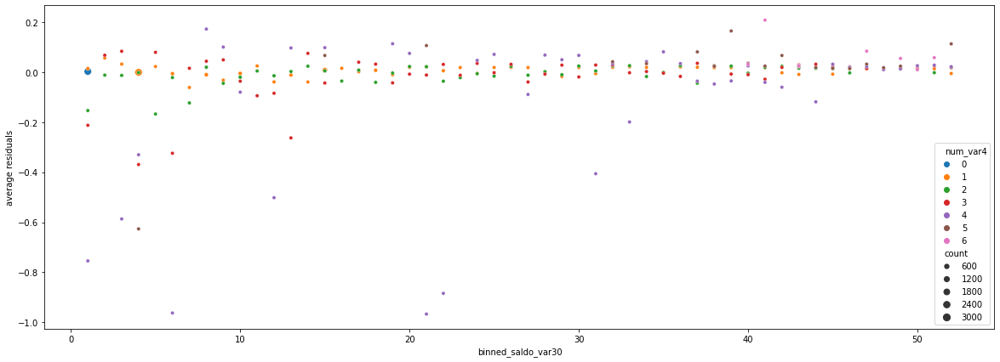

In [42]:
var_referencia = 'saldo_var30'
var_segmentacao = 'num_var4' #'num_var4'
n_bins = None

analise_residuos_feature(df_resultados = feature_e_resultados_train, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 7))

analise_residuos_feature(df_resultados = feature_e_resultados_test, 
                         var_referencia = var_referencia,
                         segmentation_var = var_segmentacao,
                         numero_de_bins = n_bins,
                         figsize = (20, 7))


# Analise por SHAP - LOGLOSS

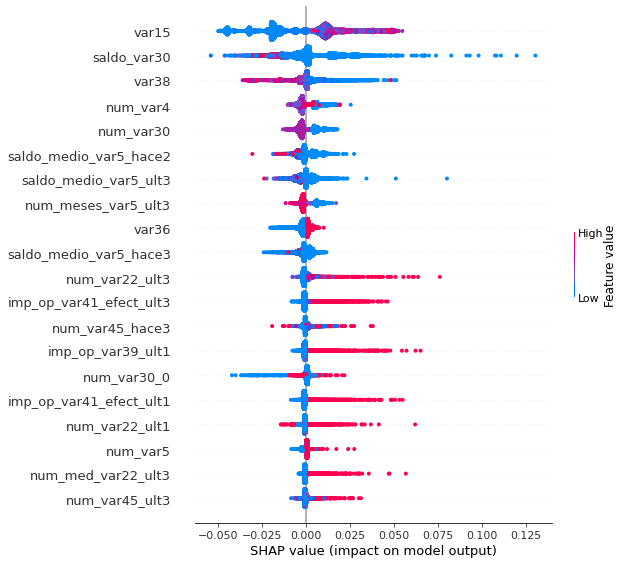

In [43]:
import shap

# Create object that can calculate shap values
explainer = shap.TreeExplainer(rf)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_clean)

shap.summary_plot(shap_values = shap_values[1], features = X_test_clean)



100%|===================| 28381/28486 [04:30<00:00]        

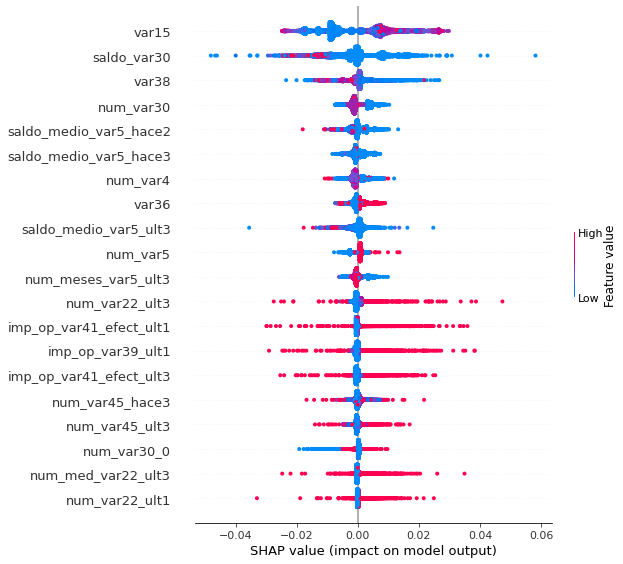

In [44]:
import shap
shap.initjs()

explainer = shap.TreeExplainer(model = rf, 
                               model_output = 'log_loss',
                               feature_perturbation = 'interventional',
                               data = X_test_clean.sample(500))


# Calculate Shap values
shap_values = explainer.shap_values(X_test_clean, y_test)

shap.summary_plot(shap_values = shap_values[1], features = X_test_clean)

In [45]:
%%time

logloss_esperado = pd.DataFrame(explainer.model.predict(X_test_clean))[1].mean()

shap.plots.force(base_value = logloss_esperado,
                 shap_values = shap_values[1][:2000],
                 features = X_test_clean.iloc[:2000])

CPU times: user 3.65 s, sys: 45 ms, total: 3.69 s
Wall time: 3.68 s


# EDA dos Erros - Parallel Coordinates

In [46]:
from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(n_quantiles = 100)

df_quantilizado = qt.fit_transform(X_test_clean)
df_quantilizado = pd.DataFrame(df_quantilizado, index = X_test_clean.index, columns = X_test_clean.columns)
df_quantilizado_results = df_quantilizado.join(resultados_estimacao_test)

df_quantilizado_e_resultados = df_quantilizado_results[['var15',
                                                        'saldo_medio_var5_hace3',
                                                        'var38',
                                                        'num_meses_var5_ult3',
                                                        'saldo_medio_var5_ult3',
                                                        'saldo_medio_var5_hace2',
                                                        'saldo_var30',
                                                        'var36',
                                                        'num_var4',
                                                        'num_var30',
                                                        'logloss',
                                                        'predicted']]

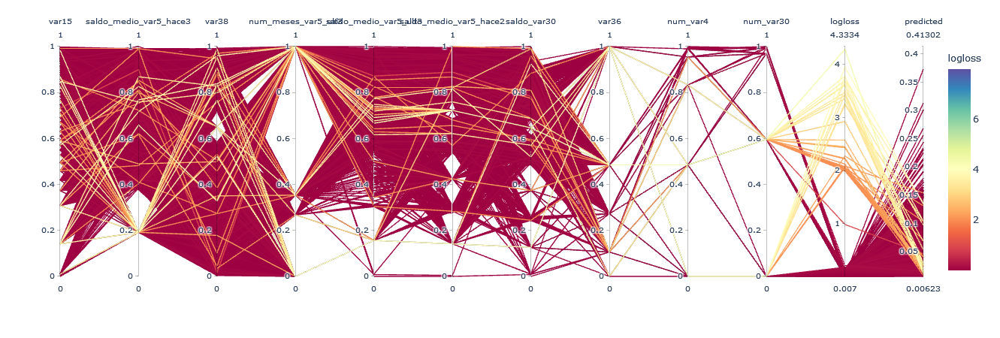

In [47]:
from plotly.offline import iplot, init_notebook_mode
import plotly.express as px
init_notebook_mode(connected=True)


fig = px.parallel_coordinates(df_quantilizado_e_resultados,
                              color ="logloss",
                              color_continuous_scale = px.colors.diverging.Spectral,
                              color_continuous_midpoint = 4)
fig.show()

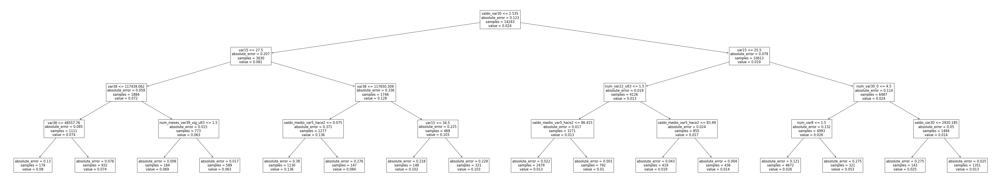

In [27]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree


error_tree = DecisionTreeRegressor(max_depth = 4, criterion = 'absolute_error', min_samples_leaf = 0.01)

error_tree.fit(X_test, feature_e_resultados_test['logloss'])


plt.figure(figsize=(80,15))
b = tree.plot_tree(error_tree, feature_names = X_test.columns);